# Automated Classification of Well Test Responses in Naturally Fractured Reservoirs Using Unsupervised Machine Learning

This notebook aims to follow step-by-step procedure to regenarate the result of a paper entitled Automated Classification of Well Test Responses in Naturally Fractured Reservoirs Using Unsupervised Machine Learning.<br>
This note book is only focused on reproducing the result for synthetix data set abd I did the validation part in the previous notebook


# Import Basic libraries

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import scipy
%matplotlib inline

In [4]:
#ignore warnings in the notebook
import warnings
warnings.filterwarnings("ignore")

In [5]:
import numba
from numba import jit

# 1.Load data

## 1.1. First Derivative of pressure

In [9]:
FirstDerivativeDimensionless= pd.read_excel('WRR_Submission\Figures\Figures_Data.xlsx', sheet_name='FirstDerivativeDimensionless',header=1)

In [10]:
pd.DataFrame(FirstDerivativeDimensionless.head(5)) 

,Dimensionless Time,Case 1,Case 2,Case 3,Case 4,Case 5,Case 6,Case 7,Case 8,Case 9,...,Case 2551,Case 2552,Case 2553,Case 2554,Case 2555,Case 2556,Case 2557,Case 2558,Case 2559,Case 2560
0,0.288200,0.180255,0.180261,0.180235,0.034647,0.180211,0.022479,0.180257,0.180297,0.180326,...,0.000791,0.198763,0.000108,0.198277,0.000243,0.198661,0.000146,0.000158,0.198234,0.198160
1,0.337668,0.195320,0.195328,0.195274,0.038585,0.195221,0.024739,0.195324,0.195367,0.195398,...,0.000852,0.215268,0.000110,0.214741,0.000252,0.215157,0.000157,0.000162,0.214695,0.214615
2,0.395627,0.211540,0.211549,0.211490,0.043410,0.211432,0.027414,0.211544,0.211590,0.211625,...,0.000897,0.229793,0.000109,0.229435,0.000253,0.229718,0.000166,0.000162,0.229403,0.229348
3,0.463535,0.227252,0.227258,0.227218,0.048913,0.227178,0.030346,0.227256,0.227286,0.227310,...,0.000934,0.244792,0.000108,0.244527,0.000252,0.244736,0.000173,0.000163,0.244503,0.244463
4,0.543099,0.242123,0.242130,0.242083,0.054493,0.242037,0.033291,0.242128,0.242164,0.242191,...,0.000960,0.260315,0.000109,0.259901,0.000250,0.260228,0.000179,0.000166,0.259865,0.259802


## 1.2. Second Derivative of pressure

In [7]:
SecDerivativeDimensionless= pd.read_excel('WRR_Submission/Figures/Figures_Data.xlsx', sheet_name='SecDerivativeProcessed',header=1)

In [8]:
pd.DataFrame(SecDerivativeDimensionless.head(5)) 

,Dimensionless Time,Case 1,Case 2,Case 3,Case 4,Case 5,Case 6,Case 7,Case 8,Case 9,...,Case 2551,Case 2552,Case 2553,Case 2554,Case 2555,Case 2556,Case 2557,Case 2558,Case 2559,Case 2560
0,0.337668,0.445836,0.445846,0.445715,0.695375,0.445576,0.604206,0.445859,0.445818,0.445795,...,0.254316,0.415063,-0.000005,0.415564,-0.008659,0.415168,0.278165,0.081288,0.415608,0.415685
1,0.395627,0.418660,0.418651,0.418708,0.688414,0.418765,0.597679,0.418673,0.418610,0.418576,...,0.134332,0.371595,-0.058485,0.372631,-0.125763,0.371812,0.177819,0.054044,0.372722,0.372881
2,0.463535,0.379452,0.379431,0.379563,0.656187,0.379691,0.571978,0.379459,0.379339,0.379263,...,-0.004251,0.321588,-0.092955,0.322942,-0.238672,0.321872,0.059409,0.034234,0.323060,0.323267
3,0.543099,0.331648,0.331622,0.331788,0.603652,0.331949,0.531326,0.331645,0.331506,0.331410,...,-0.134484,0.300781,-0.113193,0.301209,-0.335427,0.300871,-0.042918,0.021193,0.301247,0.301312
4,0.636319,0.302813,0.302814,0.302808,0.576970,0.302803,0.514214,0.302827,0.302817,0.302820,...,-0.255940,0.291788,-0.146617,0.294213,-0.400476,0.292296,-0.129923,-0.002417,0.294317,0.294343


# 2. Define required function

## 2.1. DTW

As it is stated in MathWorks website, the implemetation of DTW in MATLAB is based on [this wikiedia webpage](https://en.wikipedia.org/wiki/Dynamic_time_warping)

In [10]:
@jit(nopython=True)
def DTWDistance_without_window(x, y):
    n, m = len(x), len(y)
    DTW = np.zeros((n+1, m+1))
    DTW[1:, 0] = np.inf
    DTW[0, 1:] = np.inf
    
    for i in range(1, n+1):
        for j in range(1, m+1):
            cost = abs(x[i-1] - y[j-1])
            DTW[i, j] = cost + min(DTW[i-1, j],    # insertion
                                   DTW[i, j-1],    # deletion
                                   DTW[i-1, j-1])  # match
    return DTW[n, m]

In [11]:
@jit(nopython=True)
def DTWDistance_with_window(s, t, w, metrics='absolute'):
    n = len(s)
    m = len(t)
    DTW = np.full((n+1, m+1), np.inf)
    w = max(w, abs(n-m)) # adapt window size (*)
    DTW[0, 0] = 0
    for i in range(1, n+1):
        for j in range(1, m+1):
            if abs(i-j) <= w:
                if metrics=='euclidean':
                    cost = np.sqrt((s[i-1] - t[j-1])**2) # Euclidean distance as the cost metric
                else:
                    cost = abs(s[i-1] - t[j-1])
                DTW[i, j] = cost + min([DTW[i-1, j], DTW[i, j-1], DTW[i-1, j-1]]) # match, insertion, deletion    
    
    # Backtrack to find the optimal warping path
    path_length = 0
    i, j = n, m
    while (i, j) != (0, 0):
        path_length += 1
        min_cost = min([DTW[i-1, j], DTW[i, j-1], DTW[i-1, j-1]])
        if DTW[i-1, j] == min_cost:
            i -= 1
        elif DTW[i, j-1] == min_cost:
            j -= 1
        else:
            i -= 1
            j -= 1
            
    return DTW[n, m], path_length

## 2.2. Clustering

### 2.2.1 for different window size and lsuter size (for opimization process)

In [12]:
@jit(nopython=False)
def kMedoidClustering(TimeSeriesData,numberofElements, K, W, maxIter, maxInitializations):
    """
    Using this function, we apply K-Medoid clustering for time series dataset. This is the function for optimization process
    and through the optimiztion step we want to choose the best value for window size (for DTW calculation) and optimum number
    of clusters. so we will provide the suggested values for them as a list in the input. the input parameters are:
        -TimeSeriesData: dataset ontaining the timeseries
        -numberofElements: number of elements from dataset that we want to use for clustering
        -K: list containing number of clusters
        -W: List containing windw sizes
        -maxIter: Maximum Number of Iteration per each initialization
        -maxInitializations: Maximum Number of Initializations for each cluster number
        
    """
    TimeSeriesData_reduced = TimeSeriesData.iloc[:, 1:numberofElements+1].values.T

    #defining matrics
    totalDistanceperClusteringAllClusters = np.zeros((len(K), maxIter))
    #totalMinimumAssignperClusteringAllClusters = np.zeros((len(K), len(TimeSeriesData_reduced)))
    distanceMultInitAllClusters= np.zeros((maxInitializations*maxIter, maxIter))
    assignMultInitAllClusters= np.zeros((maxInitializations*maxIter,TimeSeriesData_reduced.shape[0]))
    wrappingFactorMultInitAllClusters= np.zeros((maxInitializations*maxIter,1))
    totalMinimumDistanceperClusteringAllClusters=np.zeros((len(K), maxIter))
    totalMinimumAssignperClusteringAllClusters=np.zeros((len(K), TimeSeriesData_reduced.shape[0]))
    totalMinimumMedoidperClusteringAllClusters=np.zeros((len(K), TimeSeriesData_reduced.shape[0]))
    totalWrappingFactorperClusteringAllClusters=np.zeros((len(K), 1))
    totalMinimumDistanceperClusteringAllClusters_forPlot=np.zeros((len(W),len(K)))
    totalWrappingFactorperClusteringAllClusters_forPlot=np.zeros((len(W),len(K)))
    totalAssignperClusteringAllClusters_forPlot=np.zeros((len(W),len(K)))

    #all_medoids = {}  # Dictionaries to store medoids and assignments for all k and w
    #all_assignments = {}    
    all_medoids = {w: {} for w in W}
    all_assignments = {w: {} for w in W}
    all_min_distances = {}
    all_wrapping_factors = {}

    #calculating DTW matrix
    for window in range(len(W)):
        # Compute the DTW distance between each pair of curves
        n_samples = TimeSeriesData_reduced.shape[0]
        dtwMatrix = np.zeros((n_samples, n_samples))
        path_length = np.zeros((n_samples, n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                a=TimeSeriesData_reduced[i]
                b=TimeSeriesData_reduced[j]
                dtwMatrix[i, j], path_length[i, j]= DTWDistance_with_window(a[a!=0],b[b!=0],W[window])
            
            
        for clusters in range(len(K)):
            distanceMultInit= np.zeros((maxInitializations,maxIter))
            assignMultInit= np.zeros((maxInitializations,TimeSeriesData_reduced.shape[0]))
            medoidMultInit= np.zeros((maxInitializations,TimeSeriesData_reduced.shape[0]))
            wrappingFactorMultInit=np.zeros((maxInitializations,1))
            wrappingFactor=0
            for multipleInit in range(maxInitializations):

                # Initialize the centroids to be random samples
                # Randomly reorder the indices of examples
                randidx = np.random.permutation(TimeSeriesData_reduced.shape[0])
                # Take the first K examples as centroids
                centroidsIdx = randidx[:K[clusters]]
                centroids = TimeSeriesData_reduced[centroidsIdx, :]

                # Cluster Assignment Step
                totalDistance = np.zeros((maxIter,))
                assign = np.zeros((len(TimeSeriesData_reduced),))
                binary_array_for_medoids = np.zeros((len(TimeSeriesData_reduced),))
                

                for i in range(len(TimeSeriesData_reduced)):
                    distance = np.zeros((K[clusters],))
                    for j in range(K[clusters]):
                        clusterId= centroidsIdx[j]
                        distance[j]=dtwMatrix[i, clusterId]
                    M, assign[i] = distance.min(), distance.argmin()
                    # accumulative 
                    totalDistance[0] += M # measures the total distance from every point to its respective cluster

                for iter in range(1, maxIter):
                    # Averaging (point that minimizes the distance to the members of the cluster) and updating centroids
                    for n in range(K[clusters]):
                        indices = np.where(assign == n)
                        indices = indices[0]
                        pairwise_sum = np.sum(dtwMatrix[indices[:, np.newaxis], indices], axis=1)
                        newCentroidRow = np.argmin(pairwise_sum)
                        centroidsIdx[n] = indices[newCentroidRow]

                    # Reassigning points to updated centroids
                    totalDistance[iter] = 0
                    for i in range(len(TimeSeriesData_reduced)):
                        distance = np.zeros((K[clusters],))
                        for j in range(K[clusters]):
                            clusterId= centroidsIdx[j]
                            distance[j]=dtwMatrix[i, clusterId]
                        MMM, assign[i] = distance.min(), distance.argmin()
                        totalDistance[iter] += MMM # measures the total distance from every point to its respective cluster

                    
                distanceMultInit[multipleInit, :] = totalDistance # summarizes the total distance per iteration for each initialization
                assignMultInit[multipleInit, :] = assign
                binary_array_for_medoids[centroidsIdx] = 1
                medoidMultInit[multipleInit, :] = binary_array_for_medoids
                           
            totalDistMinimumColumn = distanceMultInit[:,maxIter-1]#minimum column is the last column because the last iteration always has the best values
            B = np.argmin(totalDistMinimumColumn)
            totalMinimumDistanceperClusteringAllClusters[clusters,:]= distanceMultInit[B,:]
            totalMinimumAssignperClusteringAllClusters[clusters,:]= assignMultInit[B,:]
            totalMinimumMedoidperClusteringAllClusters[clusters,:]= medoidMultInit[B,:]
            MMM, assign[i] = distance.min(), distance.argmin()            
    
            wrappingFactor=0
            for j in range(K[clusters]):
                indices = np.where(np.array(totalMinimumAssignperClusteringAllClusters[clusters,:]) == j)[0]
                medoidsIdx=np.where(np.array(totalMinimumMedoidperClusteringAllClusters[clusters,:]) == 1)[0]
                clusterMedoid = list(set(indices.flatten()) & set(medoidsIdx.flatten()))               
                b =TimeSeriesData_reduced[clusterMedoid, :]
                for i in indices:
                    a = TimeSeriesData_reduced[i, :]
                    max_value = max(len(a[~(a == 0)]), len(b[~(b == 0)]))
                    wrappingFactor+=((path_length[i, clusterMedoid]-max_value)/max_value)
                    
            wrappingFactor=wrappingFactor/(len(TimeSeriesData_reduced)-1)
            distanceMultInitAllClusters[((clusters)*multipleInit):((clusters)*multipleInit)+maxInitializations,:] = distanceMultInit
            assignMultInitAllClusters[((clusters)*multipleInit):((clusters)*multipleInit)+maxInitializations,:] = assignMultInit
            totalWrappingFactorperClusteringAllClusters[clusters,0] =wrappingFactor
            
            #outputs
            # Store medoids and assignments
            if W[window] not in all_medoids:
                all_medoids[W[window]] = {}
            if W[window] not in all_assignments:
                all_assignments[W[window]] = {}
            all_medoids[W[window]][K[clusters]] = np.where(np.array(totalMinimumMedoidperClusteringAllClusters[clusters,:]) == 1)[0]  # Store medoids for this k and w
            all_assignments[W[window]][K[clusters]] = np.array(totalMinimumAssignperClusteringAllClusters[clusters,:])  # Store assignments for this k and w
 
        
        all_min_distances[W[window]] = dict(zip(K, np.amin(totalMinimumDistanceperClusteringAllClusters, axis=1)))
        all_wrapping_factors[W[window]] = dict(zip(K, np.amin(totalWrappingFactorperClusteringAllClusters, axis=1)))

    return all_min_distances, all_wrapping_factors, all_assignments, all_medoids

## 2.3 Silhouette index

In [13]:
@jit(nopython=False)
def calculate_silhouette_index(assign, medoids, DTWMatrix):
    """
    Calculate the silhouette index for clustering results.

    Parameters:
        - assign (ndarray): An array of shape (N,) containing cluster assignments for each data point.
        - medoids (list): A list of indices corresponding to the medoids.
        - DTWMatrix (ndarray): A distance matrix of shape (N, N) containing pairwise DTW distances.

    Returns:
        - silhouette_index (float): The calculated silhouette index.
    """
    num_samples = assign.shape[0]
    cluster_labels = np.unique(assign)
    num_clusters = len(cluster_labels)
    silhouette_scores = np.zeros(num_samples)

    # Calculate silhouette score for each data point
    for i in range(num_samples):
        cluster_idx = assign[i]
        if cluster_idx in cluster_labels:
            cluster_mask = assign == cluster_idx
            cluster_size = np.sum(cluster_mask)
            if cluster_size > 1:
                a = np.mean(DTWMatrix[i, cluster_mask])  # Average intra-cluster distance for sample i

                # Calculate inter-cluster distances
                b = np.min([np.mean(DTWMatrix[i, assign == cluster]) for cluster in cluster_labels if cluster != cluster_idx])

                # Calculate silhouette score
                silhouette_scores[i] = (b - a) / max(a, b)

    return silhouette_scores


# 3. Clustering

## 3.1 Define input parameters

In [12]:
K = [2,4,6,8,10,12,14,16,18,20,22]  
#K = [4,8,12,16]  
W= [5,10,20,30,40,50,60,80,100]
#W= [5,10,20]
# Maximum Number of Iterations
maxIter = 15
#maxIter = 5
# Maximum Number of Initializations
maxInitializations = 30
#maxInitializations = 6
numberofElements=2560
#numberofElements=100

## 3.2. Running clustering algorithm

In [13]:
all_min_distances, all_wrapping_factors, all_assignments, all_medoids= kMedoidClustering(SecDerivativeDimensionless,numberofElements, K, W, maxIter, maxInitializations)

## 3.3 Visualizing the result and choosing the best combination of winow size and number of clusters

#### 3.3.1. Minmum objectve function for each cluster

Using the elbow method, we identified that no significant reduction in O was obtained for c > 10 independently of w.

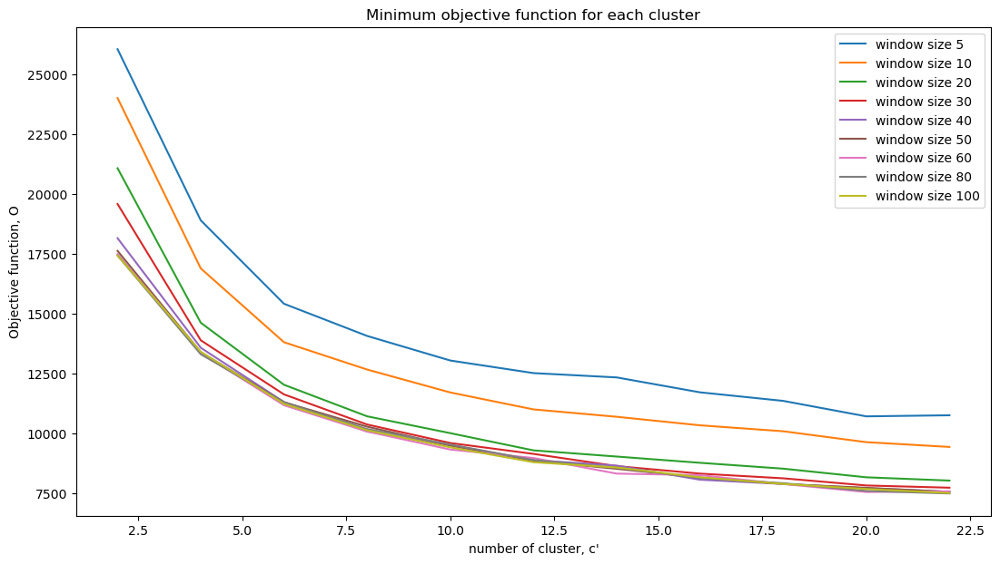

In [14]:
plt.figure(figsize=(13,7))
colorMap = plt.cm.tab10(np.linspace(0,1,len(W)))

for w in W:
    values_to_plot = []
    for k in K:
        values_to_plot.append(all_min_distances[w][k])
        
    plt.plot(K, values_to_plot, label=f'window size {w}')
    
plt.ylabel("Objective function, O")
plt.xlabel("number of cluster, c'")
plt.title('Minimum objective function for each cluster')

# Add legend to the plot
plt.legend()
plt.savefig('results/Fig13_ObjectiveFun_Cluster.png')  # specify the file name and extension

So, based on the abow figure, I would suggest to choose 10 number of clusters as the optimum one, now we can search for the optimum value for window size

To measure the extent of warping taken into account for different combinations of c and w, we established the warping factor. Values of W that are close to one indicate a significant amount of warping was necessary to align the pressure derivative curves. Ideally, we aim to achieve optimal alignment with minimal warping, meaning W should be close to zero. The diagram below illustrates the relationship between O and w when c is set to 10.

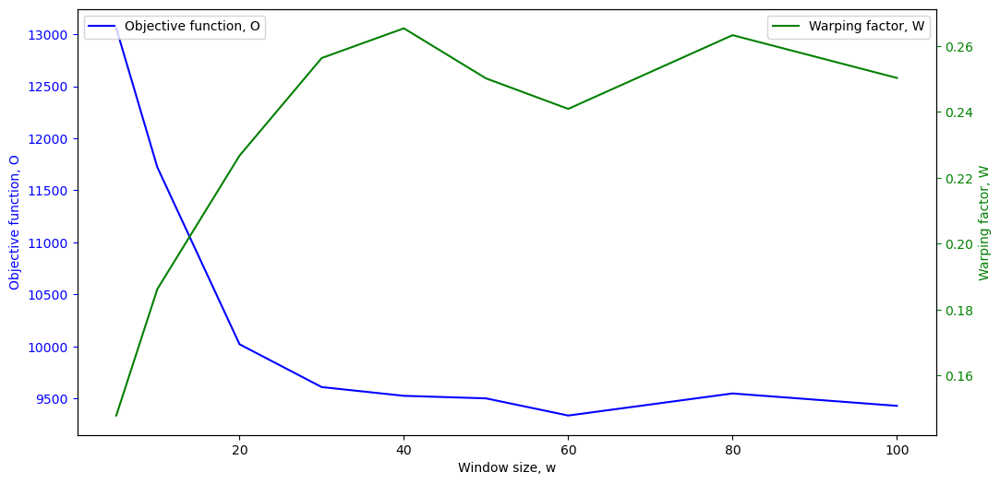

In [15]:
# Data for plotting
x = W  # list of window sizes
y1 = [all_min_distances[w][10] for w in x]  # for cluster size of 10
y2 = [all_wrapping_factors[w][10] for w in x]  # for cluster size of 10

To measure the extent of warping taken into account for different combinations of c and w, we established the warping factor. Values of W that are close to one indicate a significant amount of warping was necessary to align the pressure derivative curves. Ideally, we aim to achieve optimal alignment with minimal warping, meaning W should be close to zero. The diagram below illustrates the relationship between O and w when c is set to 10.
# Create a figure and axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot y1 vs x on the first y-axis
ax1.plot(x, y1, label='Objective function, O', color='blue')
ax1.set_xlabel('Window size, w')
ax1.set_ylabel('Objective function, O', color='blue')
ax1.tick_params('y', colors='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot y2 vs x on the second y-axis
ax2.plot(x, y2, label='Warping factor, W', color='green')
ax2.set_ylabel('Warping factor, W', color='green')
ax2.tick_params('y', colors='green')

# Set labels and legend
ax1.set_ylabel('Objective function, O')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('')
plt.savefig('results/Fig14_ObjectiveFun_windowSize_10.png')  # specify the file name and extension


It is worth noting that W exhibits a significant decrease when w is less than 30. However, this decrease comes with a considerable increase in O. In order to strike a balance between accuracy and warping, we decided to choose a cluster number of c = 10 for the pressure derivative curves, as recommended for w = 30. This choice represents an acceptable compromise between achieving accuracy and minimizing warping effects.

### 3.4 Saving outputs

In [12]:
import os

# Create the "results" folder if it doesn't exist
if not os.path.exists('results'):
    os.makedirs('results')

In [77]:
writer = pd.ExcelWriter('results/ClusteringResultAllWidowSizesAndClusters.xlsx')

In [78]:
ObjectiveFunForAlllClustersAndWindowSize = pd.DataFrame(all_min_distances)
ObjectiveFunForAlllClustersAndWindowSize.to_excel(writer, sheet_name='ObjectiveFunForAllClusters')

WrappingFactorForAlllClustersAndWindowSize = pd.DataFrame(all_wrapping_factors)
WrappingFactorForAlllClustersAndWindowSize.to_excel(writer, sheet_name='WrappingFactorForAllClusters')

AssignForSecondDerivative = pd.DataFrame(all_assignments)
AssignForSecondDerivative.to_excel(writer, sheet_name='AssignForSecondDerivative')

MedoidsForSecDerivative = pd.DataFrame(all_medoids)
MedoidsForSecDerivative.to_excel(writer, sheet_name='MedoidsForSecDerivative')
 
writer.save()
# Close the Excel writer
writer.close()

So, in the next step, we want to explor this cluster more again

# 4. Visulaize the result of best combination for clustering

## 4.1 Define input parameters

In [24]:
K_best = [10]   
W_best= [30]
maxIter_best = 30
maxInitializations_best = 60
numberofElements_best=2560

## 4.2. Running clustering algorithm

In [26]:
all_min_distances_best, all_wrapping_factors_best, all_assignments_best, all_medoids_best= kMedoidClustering(SecDerivativeDimensionless,numberofElements_best, K_best, W_best, maxIter_best, maxInitializations_best)

## 4.3. Visualize the clustering resullt

In [71]:
# Specific cluster and window size
k_best = 10
w_best = 30
assignments = all_assignments_best[w_best][k_best]
medoids = all_medoids_best[w_best][k_best]

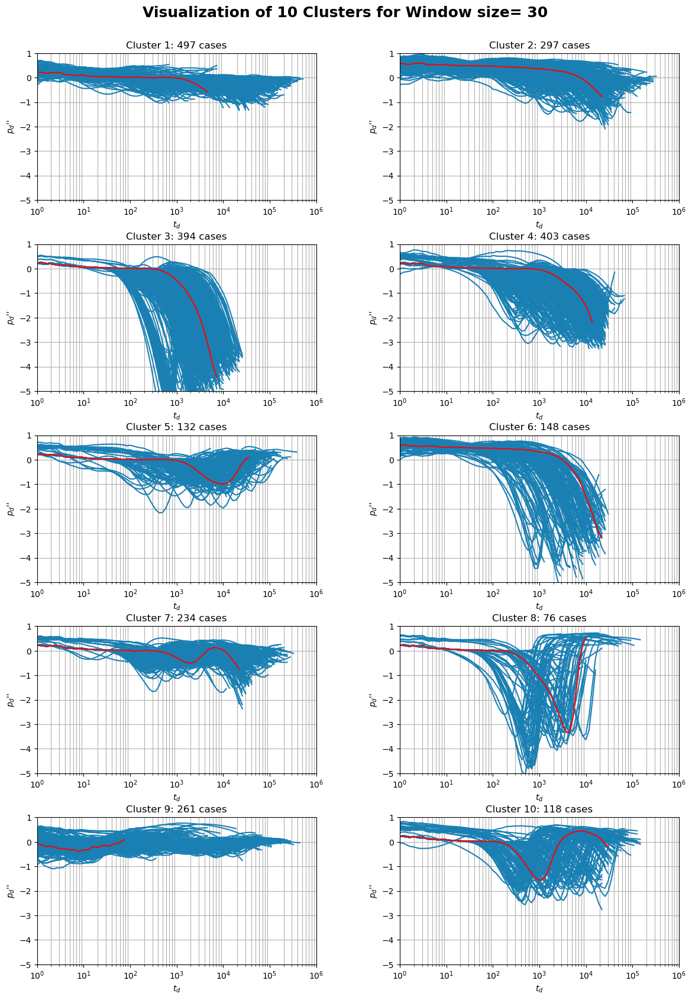

In [62]:
plt.figure(figsize=(14,20))
plt.suptitle(f"Visualization of {k_best} Clusters for Window size= {w_best} ", fontsize=18, fontweight='bold', y=0.92)

for i in range(k):  # Changed to 10 clusters
    plt.subplot(5,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments == i)[0]
    lengCluster=len(clusterIndices)
    for j in clusterIndices:
        # Filter out zero values
        mask = SecDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            # Plot non-zero data points
            plt.plot(SecDerivativeDimensionless.values[mask,0], 
                     SecDerivativeDimensionless.values[mask,j+1], 
                     color=(0.1, 0.5, 0.7))
            plt.xlabel("$t_{d}$")
            plt.ylabel("$p_{d}$''")
            plt.title('Cluster ' + str(i+1)+': ' + str(lengCluster) + ' cases') 
            plt.xscale('log')                
for i in range(k):  # Changed to 10 clusters
    plt.subplot(5,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments == i)[0]
    for j in clusterIndices:
        # Filter out zero values
        mask = SecDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            if j in medoids:
                # Plot non-zero data points
                plt.plot(SecDerivativeDimensionless.values[mask,0], 
                         SecDerivativeDimensionless.values[mask,j+1], 
                         color='red')
                plt.xscale('log')
                plt.ylim((-5,1))
                plt.xlim((10e-1,10e5)) 
                plt.grid(visible=True, which='minor',axis='x' ) 
                plt.grid(visible=True, which='major',axis='y' )                
                
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig('results/Fig16_plottingperCluster_secDerivative_10_30.png')  # specify the file name and extension

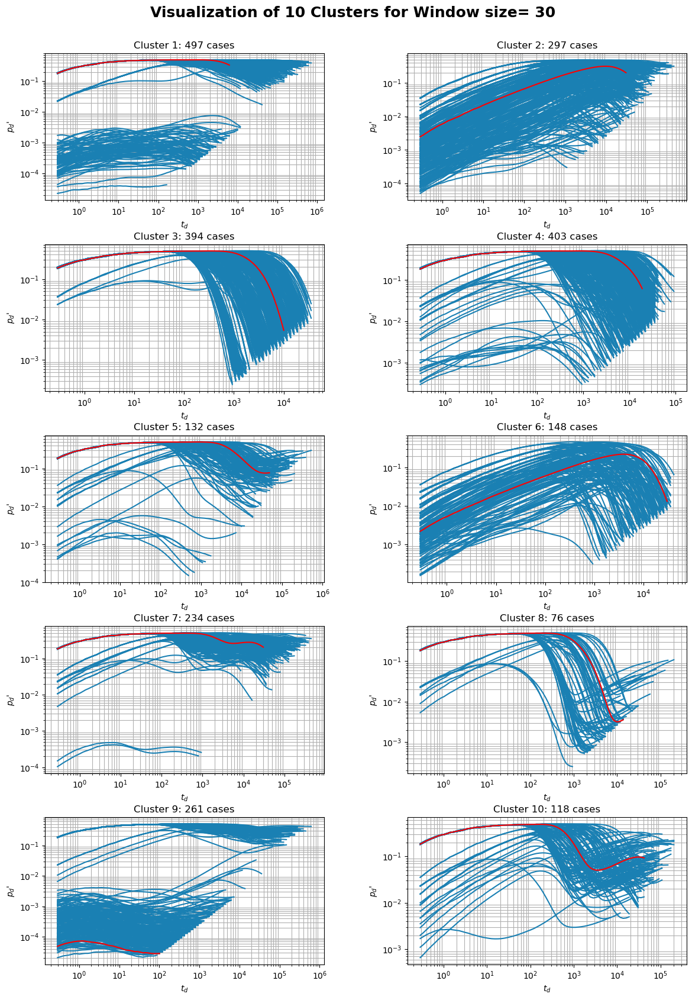

In [66]:
plt.figure(figsize=(14,20))
plt.suptitle(f"Visualization of {k_best} Clusters for Window size= {w_best} ", fontsize=18, fontweight='bold', y=0.92)

for i in range(k):  # Changed to 10 clusters
    plt.subplot(5,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments == i)[0]
    lengCluster=len(clusterIndices)
    for j in clusterIndices:
        # Filter out zero values
        mask = FirstDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            # Plot non-zero data points
            plt.plot(FirstDerivativeDimensionless.values[mask,0], 
                     FirstDerivativeDimensionless.values[mask,j+1], 
                     color=(0.1, 0.5, 0.7))
            plt.xlabel("$t_{d}$")
            plt.ylabel("$p_{d}$'")
            plt.title('Cluster ' + str(i+1)+': ' + str(lengCluster) + ' cases') 
            plt.xscale('log')
            plt.yscale('log') 
for i in range(k):  # Changed to 10 clusters
    plt.subplot(5,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments == i)[0]
    for j in clusterIndices:
        # Filter out zero values
        mask = FirstDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            if j in medoids:
                # Plot non-zero data points
                plt.plot(FirstDerivativeDimensionless.values[mask,0], 
                         FirstDerivativeDimensionless.values[mask,j+1], 
                         color='red')
                plt.xscale('log')
                plt.yscale('log') 
                plt.grid(True,which='minor')  # Add gridlines
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig('results/Fig15_plottingperCluster_firstDerivative10_30.png')  # specify the file name and extension

## 4.2. Further investigation of the result

### 4.2.1. silhouette index 

The performance of the clustering algorithm is also evaluated using the silhouette index Y, which is widely used for clustering validation. Y measures how close a point in one cluster is to other points in neighbour clusters

In [67]:
SecDerivativeDimensionless_reduced = SecDerivativeDimensionless.iloc[:, 1:numberofElements+1].values.T
n_samples = SecDerivativeDimensionless_reduced.shape[0]
dtwMatrix = np.zeros((n_samples, n_samples))
for i in range(n_samples):
    for j in range(n_samples):
        a=SecDerivativeDimensionless_reduced[i]
        b=SecDerivativeDimensionless_reduced[j]
        dtwMatrix[i, j],_ = DTWDistance_with_window(a[a!=0],b[b!=0],30)

In [68]:
silhouette=calculate_silhouette_index(assignments, medoids, dtwMatrix)

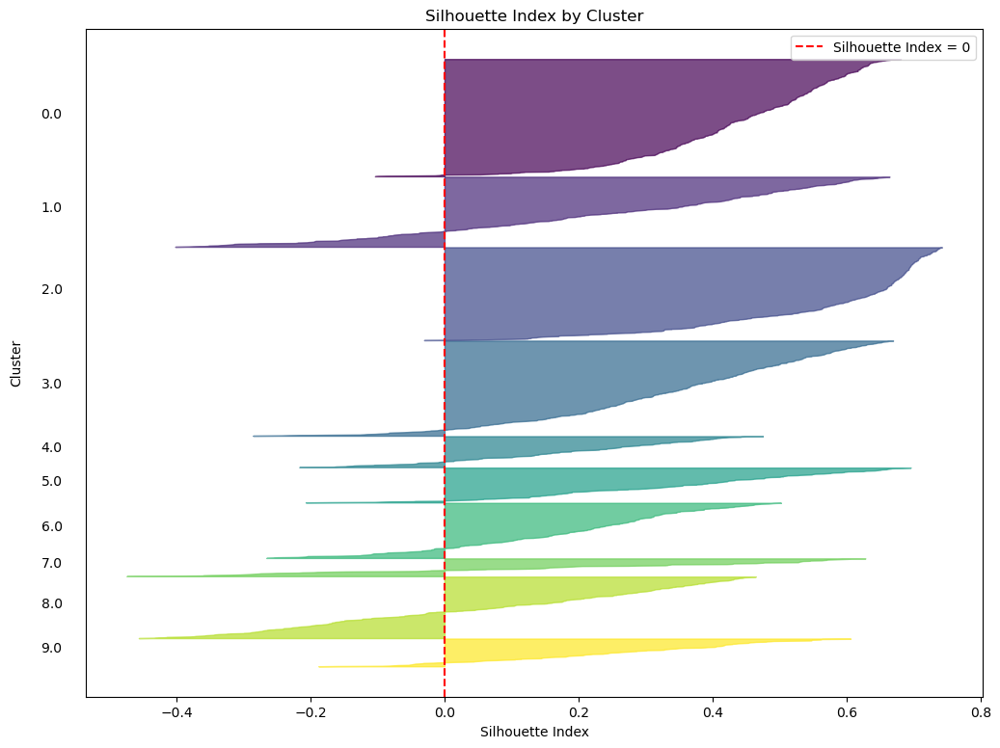

In [103]:
# Get unique cluster labels
unique_clusters = np.unique(assignments)
fig, ax = plt.subplots(figsize=(12, 9))

# Reverse the order of unique_clusters
unique_clusters = unique_clusters[::-1]

# Plot silhouette index vs cluster assignments
y_lower = 1
for cluster in unique_clusters:
    cluster_silhouette = silhouette[assignments == cluster]
    cluster_silhouette.sort()
    cluster_size = cluster_silhouette.shape[0]
    y_upper = y_lower + cluster_size
    color = plt.cm.viridis(cluster / np.max(unique_clusters))
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette, facecolor=color, edgecolor=color, alpha=0.7)
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(cluster), ha='left', transform=ax.get_yaxis_transform())  # Modify y-coordinate of text
    y_lower = y_upper + 1

ax.axvline(x=0, color='red', linestyle='--', label='Silhouette Index = 0')  # Add vertical line at x=0
ax.set_xlabel('Silhouette Index',)
ax.set_ylabel('Cluster')
ax.set_title('Silhouette Index by Cluster')
ax.set_yticks([])  # Remove y-ticks
ax.yaxis.set_label_coords(-0.07, 0.5)
ax.legend()

plt.savefig('results/Fig17_Silhouette_index_10_30.png')  

In [75]:
# Calculate average silhouette index
average_silhouette = np.mean(silhouette)

# Calculate percentage of samples misclassified
misclassified_percent = len(np.where(silhouette < 0)[0]) / len(silhouette) * 100

print("Average Silhouette Index:", average_silhouette)
print("Percentage of Misclassified Samples:", misclassified_percent, "%")

Average Silhouette Index: 0.31904263611219824
Percentage of Misclassified Samples: 12.968750000000002 %


So the average Silhouette index is 0.32 and only 13% of the samples are missclassifid which is acceptable

### 4.2.2. 3D representation

here a visual representation of the classification results by applying non-metric multi-dimensional scaling (MDS) is shown which is a dimensionality reduction technique and highlights the relative distances, measured using DTW, between the p″ cluster member

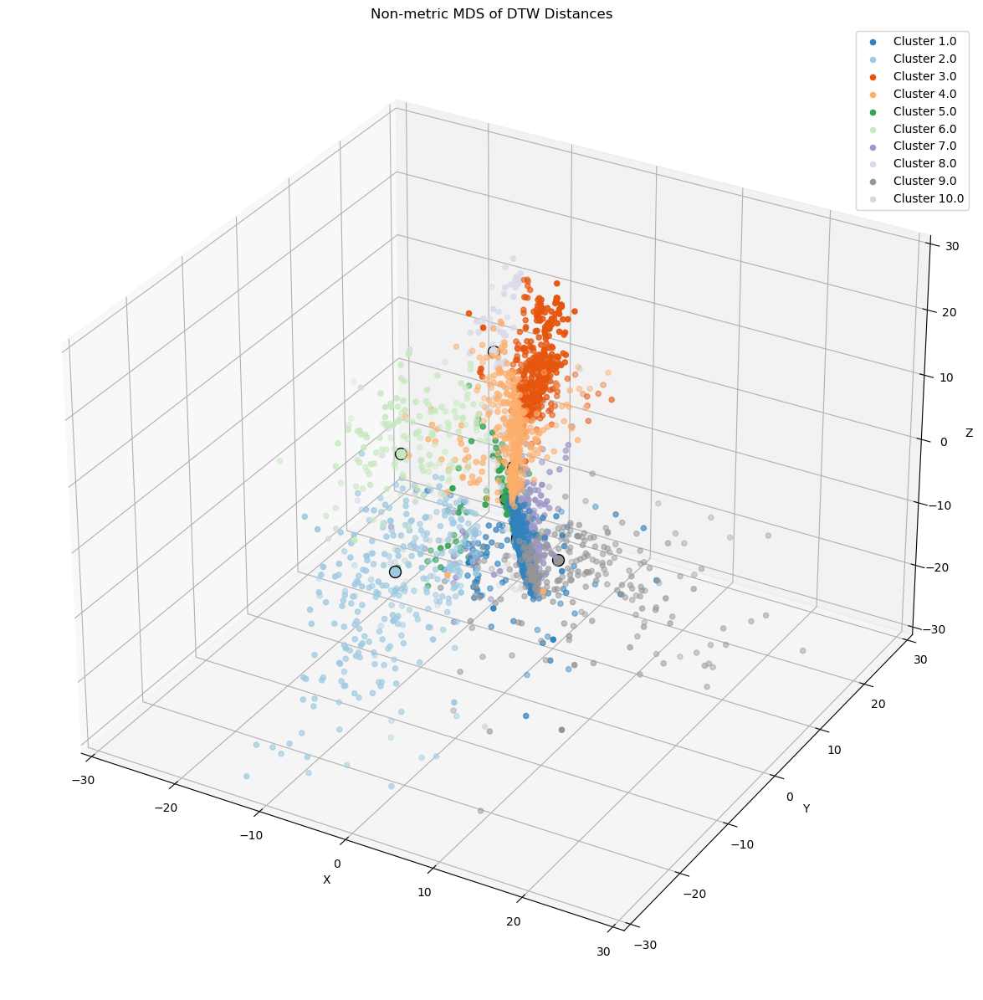

In [86]:
from sklearn.manifold import MDS
from mpl_toolkits.mplot3d import Axes3D

# Load DTW distances and cluster indices
dtw_distances = dtwMatrix 
cluster_indices = assignments+1  

# Perform non-metric multidimensional scaling (MDS)
mds = MDS(n_components=3, dissimilarity='precomputed')
mds_coordinates = mds.fit_transform(dtw_distances)

# Set larger figure size
fig = plt.figure(figsize=(15, 15))

ax = fig.add_subplot(111, projection='3d')

# Assign different colors to different clusters using tab20c colormap
unique_clusters = np.unique(cluster_indices)
colors = plt.cm.tab20c(np.linspace(0, 1, len(unique_clusters)))
for i, cluster in enumerate(unique_clusters):
    cluster_indices_mask = cluster_indices == cluster
    ax.scatter(mds_coordinates[cluster_indices_mask, 0],
               mds_coordinates[cluster_indices_mask, 1],
               mds_coordinates[cluster_indices_mask, 2],
               c=colors[i], label='Cluster {}'.format(cluster))
    
for medoid_idx, medoid in enumerate(medoids):
    cluster = int(cluster_indices[medoid]-1)
    ax.scatter(mds_coordinates[medoid, 0],
               mds_coordinates[medoid, 1],
               mds_coordinates[medoid, 2],
               c=colors[cluster], marker='o',edgecolors='black', s=100)
    
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_xlim(-30,30)
ax.set_ylim(-30,30)
ax.set_zlim(-30,30)
ax.legend()
plt.title('Non-metric MDS of DTW Distances')
plt.savefig('results/Fig18_3Drespresentation_10_30.png')  # specify the file name and extensionplt.show()

So, it seems that compared to othr clusters which are plotted narrowly along the origin of the x-axis, clusters 2,6,9 are plotted at a significant distance away from the origin of the x-axis, indicating that these p′ were considerably different in comparison. 

### 3.1.4 Saving outputs

In [84]:
writer = pd.ExcelWriter('results/ClusteringResultFor10ClustersWindoSize30.xlsx')

In [85]:
AssignForSecondDerivative = pd.DataFrame(all_assignments_best)
AssignForSecondDerivative.to_excel(writer, sheet_name='Assignment')

MedoidsForSecDerivative = pd.DataFrame(all_medoids_best)
MedoidsForSecDerivative.to_excel(writer, sheet_name='Medoids')

DTWForSecDerivative = pd.DataFrame(dtwMatrix)
DTWForSecDerivative.to_excel(writer, sheet_name='DTWForSecDerivative')

SilhouetteForSecondDerivative = pd.DataFrame(silhouette)
SilhouetteForSecondDerivative.to_excel(writer, sheet_name='SilhouetteForSecondDerivative')

writer.save()
# Close the Excel writer
writer.close()

# 5. Comparing the result of the proposed clustering with the paper

So as the result of the previous chapter shows, it seems that windowsize=40 and ckuster number=10 are better choice in our case. So in this part, I want to consider these value as optimum case and I generated the result again

## 5.1. comparision of clustered curves

In [1]:
import matplotlib.image as mpimg
from PIL import Image
import requests
from io import BytesIO

### 5.1.1. Second Derivative of pressure

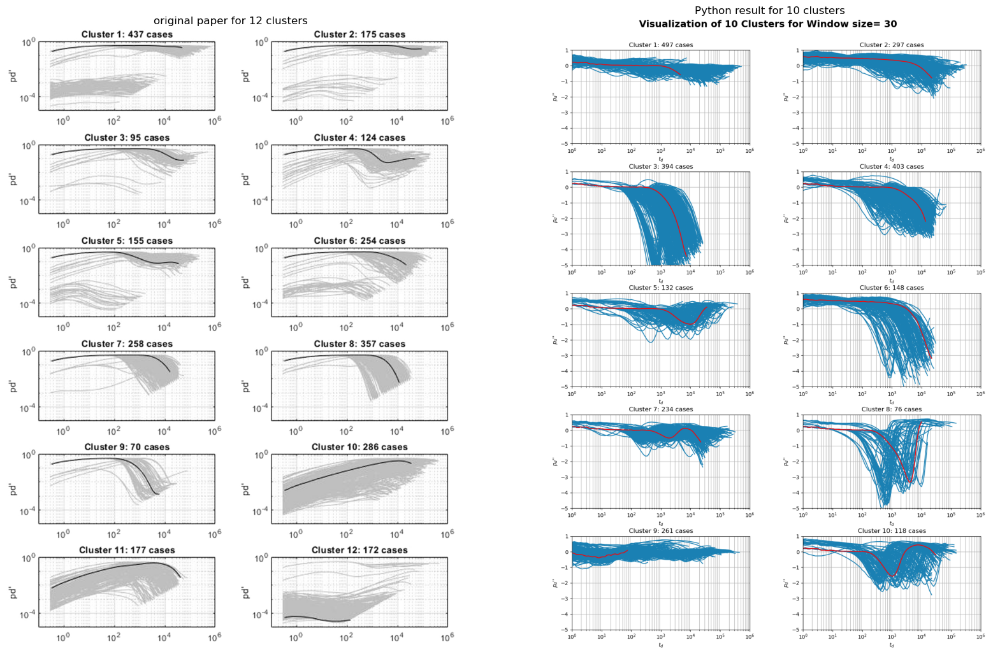

In [13]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig15_HTML.png"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig16_plottingperCluster_secDerivative_10_30.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 10 clusters')

plt.show()

### 5.1.2. First Derivative of Pressure

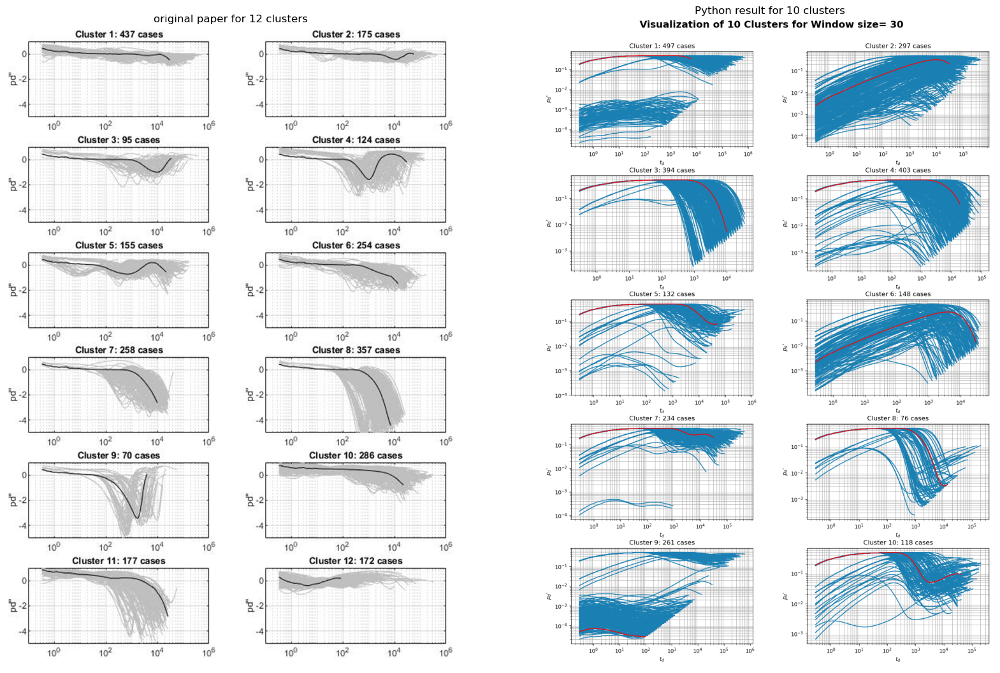

In [48]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig16_HTML.png"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig15_plottingperCluster_firstDerivative10_30.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 10 clusters')

plt.show()

after an in-depth comparision between these two plots, I think clusters in pythin code could be related to the one in the original paper as below:
1. cluster 1 -> 1
2. cluster 2 -> 10
3. cluster 3 -> 8
4. cluster 4 -> 6,7
5. cluster 5 -> 2 or 3
6. cluster 6 -> 11 
7. cluster 7 -> 5,3 or 5,2
8. cluster 8 -> 9
9. cluster 9 -> 12
10. cluster 10 -> 4

so it seems that cluster 2, 3 and 5 have similar behavior that python algorithm decided to cluster them i2 groups instead of 3. more over, clusters 6,7 have similar behavior that the python algorithm decided to combine them together

## 5.2. comparing Silhoutte plot

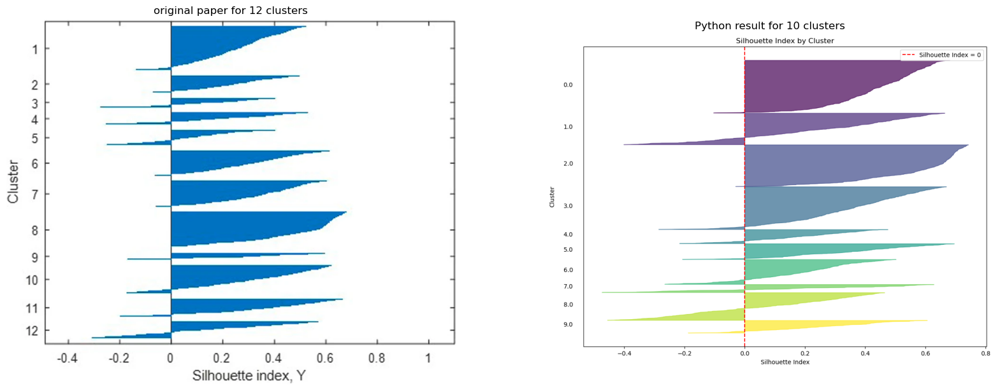

In [3]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig17_HTML.png?as=webp"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig17_Silhouette_index_10_30.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 15))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 10 clusters')

plt.show()

So the average Silhouette index for python model is 0.32 and in the original paper is almost 0.3. Aslo for the python code 13% of the samples are missclassifid and in the original paper it is 12%.

Moreover, comparing the graph with the similarity proposed in section 4.1. shows that our analysis for finding the similarities here was correct

## 5.3. Comparing 3D plot

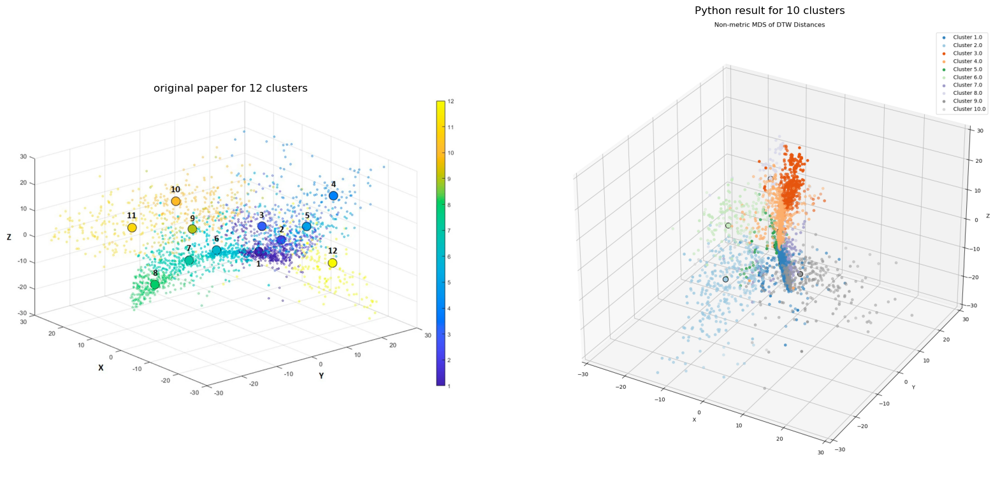

In [4]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig18_HTML.png?as=webp"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig18_3Drespresentation_10_30.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 15))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 10 clusters')

plt.show()

As it is stated in the paper, in the left figure data belonging to clusters 1–8 plotted narrowly along the origin of the x-axis, while clusters 10–12 plotted at a significant distance away from the origin of the x-axis, indicating that these p′ were considerably different in comparison. for the left one, this distant clsuters are 2, 6 and 9 which are equivalent to 10, 11 and 12. again this shows that our comparison is consistent.

## 5.4. Final Discussion based on box plot

Unfortunately, I dont have the data for plotting the box plotr for my result, but we can refer to the box plot which is in the original paper 

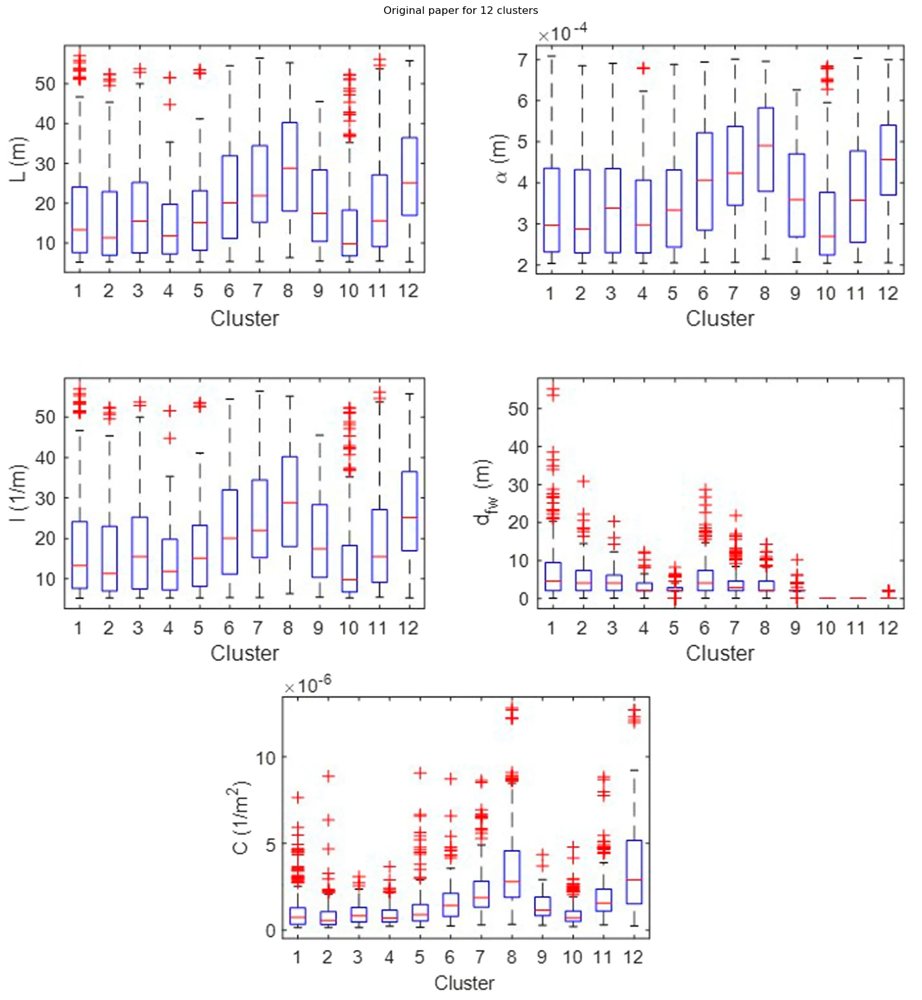

In [110]:
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig19_HTML.png?as=webp"
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))

# Create a figure with one subplot
fig, ax = plt.subplots(figsize=(20, 20))

# Display the image
ax.imshow(img_web)
ax.axis('off')  # Hide axes
ax.set_title('Original paper for 12 clusters')

plt.show()

looking at the box plot abow, it seems that clusters 2 , 3 and 5, and also 6,7 are similar to each other, so maybe considering them as a combining them might be an option

(I want to also note that in the elbow method, the optimum number of cluster was stiamte to roughly be around 8 to 10, which 9 and 8 is also seems a reasonable choice because clusters 2,3,5 can be combined to form only one cluster and cluster 3 and 9 also show similar properies, but I assume that since the distance from well is very important parameter, for 10 number of clusters they are still considered in a seperate group

# 6. clustering result for 12 numbers of cluster and window size=20

## 6.1 Define input parameters

In [16]:
K_12k20w = [12]   
W_12k20w= [20]
maxIter_12k20w = 30
numberofElements_12k20w =2560
maxInitializations_12k20w = 70
numberofElements_12k20w=2560

## 6.2. Running clustering algorithm

In [17]:
all_min_distances_12k20w, all_wrapping_factors_12k20w, all_assignments_12k20w, all_medoids_12k20w= kMedoidClustering(SecDerivativeDimensionless,numberofElements_12k20w, K_12k20w, W_12k20w, maxIter_12k20w, maxInitializations_12k20w)

## 6.3. Visualize the clustering resullt

In [19]:
# Specific cluster and window size
k_12k20w = 12
w_12k20w = 20
assignments_12k20w = all_assignments_12k20w[w_12k20w][k_12k20w]
medoids_12k20w = all_medoids_12k20w[w_12k20w][k_12k20w]

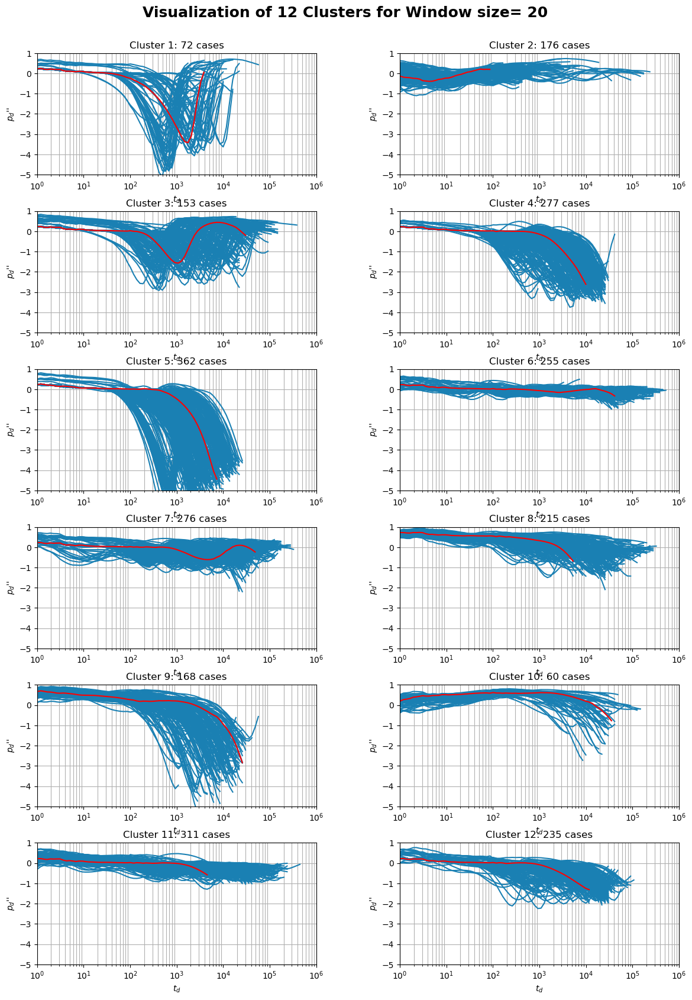

In [23]:
plt.figure(figsize=(14,20))
plt.suptitle(f"Visualization of {k_12k20w} Clusters for Window size= {w_12k20w} ", fontsize=18, fontweight='bold', y=0.92)

for i in range(k_12k20w):  # Changed to 10 clusters
    plt.subplot(6,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments_12k20w == i)[0]
    lengCluster=len(clusterIndices)
    for j in clusterIndices:
        # Filter out zero values
        mask = SecDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            # Plot non-zero data points
            plt.plot(SecDerivativeDimensionless.values[mask,0], 
                     SecDerivativeDimensionless.values[mask,j+1], 
                     color=(0.1, 0.5, 0.7))
            plt.xlabel("$t_{d}$")
            plt.ylabel("$p_{d}$''")
            plt.title('Cluster ' + str(i+1)+': ' + str(lengCluster) + ' cases') 
            plt.xscale('log')                
for i in range(k_12k20w):  # Changed to 10 clusters
    plt.subplot(6,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments_12k20w == i)[0]
    for j in clusterIndices:
        # Filter out zero values
        mask = SecDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            if j in medoids_12k20w:
                # Plot non-zero data points
                plt.plot(SecDerivativeDimensionless.values[mask,0], 
                         SecDerivativeDimensionless.values[mask,j+1], 
                         color='red')
                plt.xscale('log')
                plt.ylim((-5,1))
                plt.xlim((10e-1,10e5)) 
                plt.grid(visible=True, which='minor',axis='x' ) 
                plt.grid(visible=True, which='major',axis='y' )                
                
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig('results/Fig16_plottingperCluster_secDerivative_12_20.png')  # specify the file name and extension

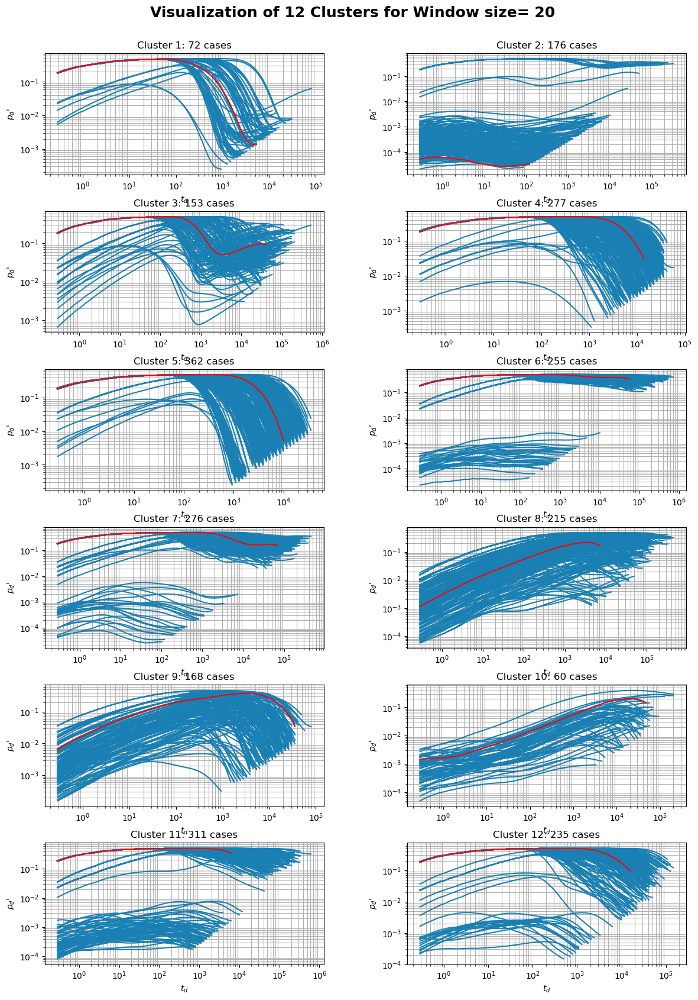

In [26]:
plt.figure(figsize=(14,20))
plt.suptitle(f"Visualization of {k_12k20w} Clusters for Window size= {w_12k20w} ", fontsize=18, fontweight='bold', y=0.92)

for i in range(k_12k20w):  # Changed to 10 clusters
    plt.subplot(6,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments_12k20w == i)[0]
    lengCluster=len(clusterIndices)
    for j in clusterIndices:
        # Filter out zero values
        mask = FirstDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            # Plot non-zero data points
            plt.plot(FirstDerivativeDimensionless.values[mask,0], 
                     FirstDerivativeDimensionless.values[mask,j+1], 
                     color=(0.1, 0.5, 0.7))
            plt.xlabel("$t_{d}$")
            plt.ylabel("$p_{d}$'")
            plt.title('Cluster ' + str(i+1)+': ' + str(lengCluster) + ' cases') 
            plt.xscale('log')
            plt.yscale('log') 
for i in range(k_12k20w):  # Changed to 10 clusters
    plt.subplot(6,2, i+1)  # Adjusted subplot layout for 10 clusters
    clusterIndices = np.where(assignments_12k20w == i)[0]
    for j in clusterIndices:
        # Filter out zero values
        mask = FirstDerivativeDimensionless.values[:,j+1] != 0
        if np.any(mask):
            if j in medoids_12k20w:
                # Plot non-zero data points
                plt.plot(FirstDerivativeDimensionless.values[mask,0], 
                         FirstDerivativeDimensionless.values[mask,j+1], 
                         color='red')
                plt.xscale('log')
                plt.yscale('log') 
                plt.grid(True,which='minor')  # Add gridlines
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig('results/Fig15_plottingperCluster_firstDerivative12_20.png')  # specify the file name and extension

## 6.2. Further investigation of the result

### 6.2.1. silhouette index 

The performance of the clustering algorithm is also evaluated using the silhouette index Y, which is widely used for clustering validation. Y measures how close a point in one cluster is to other points in neighbour clusters

In [28]:
SecDerivativeDimensionless_reduced = SecDerivativeDimensionless.iloc[:, 1:numberofElements_12k20w+1].values.T
n_samples = SecDerivativeDimensionless_reduced.shape[0]
dtwMatrix = np.zeros((n_samples, n_samples))
for i in range(n_samples):
    for j in range(n_samples):
        a=SecDerivativeDimensionless_reduced[i]
        b=SecDerivativeDimensionless_reduced[j]
        dtwMatrix[i, j],_ = DTWDistance_with_window(a[a!=0],b[b!=0],20)

In [29]:
silhouette=calculate_silhouette_index(assignments_12k20w, medoids_12k20w, dtwMatrix)

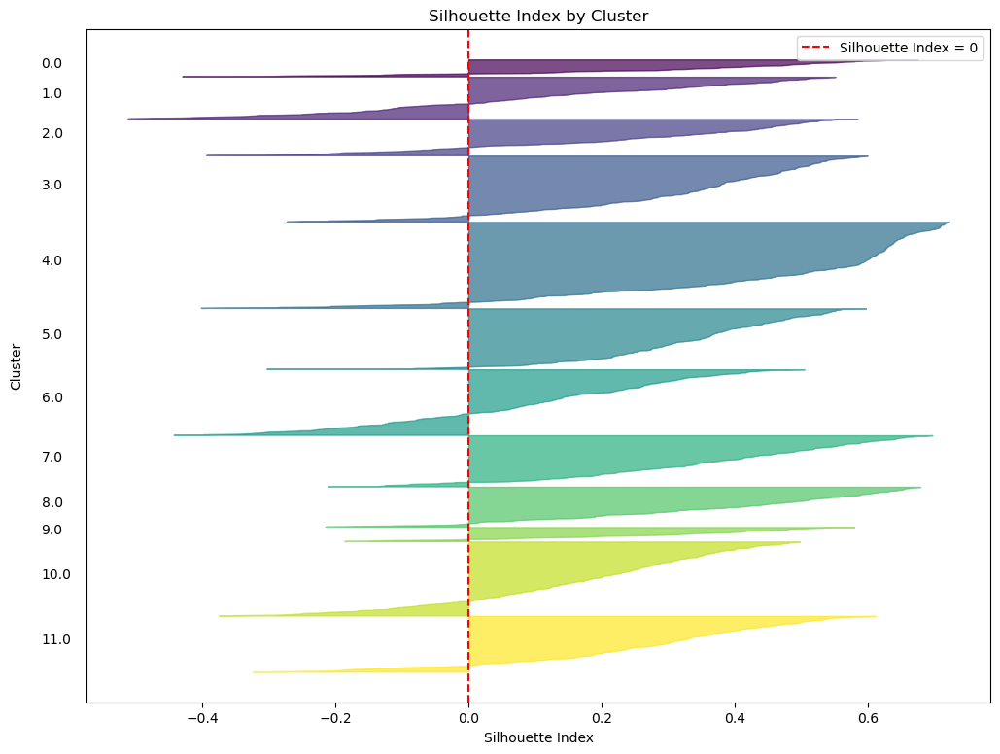

In [30]:
# Get unique cluster labels
unique_clusters = np.unique(assignments_12k20w)
fig, ax = plt.subplots(figsize=(12, 9))

# Reverse the order of unique_clusters
unique_clusters = unique_clusters[::-1]

# Plot silhouette index vs cluster assignments
y_lower = 1
for cluster in unique_clusters:
    cluster_silhouette = silhouette[assignments_12k20w == cluster]
    cluster_silhouette.sort()
    cluster_size = cluster_silhouette.shape[0]
    y_upper = y_lower + cluster_size
    color = plt.cm.viridis(cluster / np.max(unique_clusters))
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette, facecolor=color, edgecolor=color, alpha=0.7)
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(cluster), ha='left', transform=ax.get_yaxis_transform())  # Modify y-coordinate of text
    y_lower = y_upper + 1

ax.axvline(x=0, color='red', linestyle='--', label='Silhouette Index = 0')  # Add vertical line at x=0
ax.set_xlabel('Silhouette Index',)
ax.set_ylabel('Cluster')
ax.set_title('Silhouette Index by Cluster')
ax.set_yticks([])  # Remove y-ticks
ax.yaxis.set_label_coords(-0.07, 0.5)
ax.legend()

plt.savefig('results/Fig17_Silhouette_index_12_20.png')  

In [31]:
# Calculate average silhouette index
average_silhouette = np.mean(silhouette)

# Calculate percentage of samples misclassified
misclassified_percent = len(np.where(silhouette < 0)[0]) / len(silhouette) * 100

print("Average Silhouette Index:", average_silhouette)
print("Percentage of Misclassified Samples:", misclassified_percent, "%")

Average Silhouette Index: 0.2718962591520554
Percentage of Misclassified Samples: 15.4296875 %


So the average Silhouette index is 0.27 and only 15.4% of the samples are missclassifid which is acceptable

### 6.2.2. 3D representation

here a visual representation of the classification results by applying non-metric multi-dimensional scaling (MDS) is shown which is a dimensionality reduction technique and highlights the relative distances, measured using DTW, between the p″ cluster member

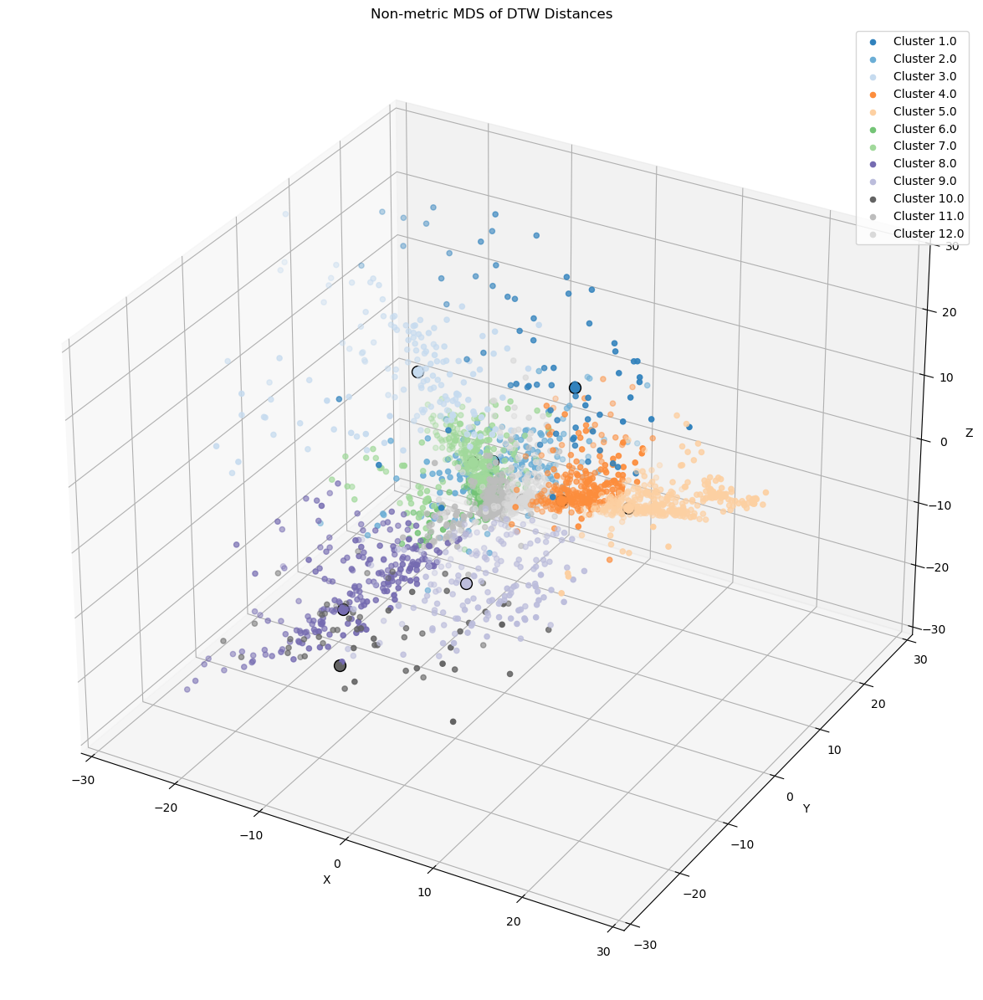

In [33]:
# Load DTW distances and cluster indices
dtw_distances = dtwMatrix 
cluster_indices = assignments_12k20w+1  

# Perform non-metric multidimensional scaling (MDS)
mds = MDS(n_components=3, dissimilarity='precomputed')
mds_coordinates = mds.fit_transform(dtw_distances)

# Set larger figure size
fig = plt.figure(figsize=(15, 15))

ax = fig.add_subplot(111, projection='3d')

# Assign different colors to different clusters using tab20c colormap
unique_clusters = np.unique(cluster_indices)
colors = plt.cm.tab20c(np.linspace(0, 1, len(unique_clusters)))
for i, cluster in enumerate(unique_clusters):
    cluster_indices_mask = cluster_indices == cluster
    ax.scatter(mds_coordinates[cluster_indices_mask, 0],
               mds_coordinates[cluster_indices_mask, 1],
               mds_coordinates[cluster_indices_mask, 2],
               c=colors[i], label='Cluster {}'.format(cluster))
    
for medoid_idx, medoid in enumerate(medoids_12k20w):
    cluster = int(cluster_indices[medoid]-1)
    ax.scatter(mds_coordinates[medoid, 0],
               mds_coordinates[medoid, 1],
               mds_coordinates[medoid, 2],
               c=colors[cluster], marker='o',edgecolors='black', s=100)
    
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_xlim(-30,30)
ax.set_ylim(-30,30)
ax.set_zlim(-30,30)
ax.legend()
plt.title('Non-metric MDS of DTW Distances')
plt.savefig('results/Fig18_3Drespresentation_12_20.png')  # specify the file name and extensionplt.show()

So, it seems that compared to othr clusters which are plotted narrowly along the origin of the x-axis, clusters 2,8,9,10 are plotted at a significant distance away from the origin of the x-axis, indicating that these p′ were considerably different in comparison. 

## 6.3 Saving outputs

In [34]:
writer = pd.ExcelWriter('results/ClusteringResultFor12ClustersWindoSize20.xlsx')

In [36]:
AssignForSecondDerivative = pd.DataFrame(all_assignments_12k20w)
AssignForSecondDerivative.to_excel(writer, sheet_name='Assignment_12k20w')

MedoidsForSecDerivative = pd.DataFrame(all_medoids_12k20w)
MedoidsForSecDerivative.to_excel(writer, sheet_name='Medoids_12k20w')

DTWForSecDerivative = pd.DataFrame(dtwMatrix)
DTWForSecDerivative.to_excel(writer, sheet_name='DTWForSecDerivative')

SilhouetteForSecondDerivative = pd.DataFrame(silhouette)
SilhouetteForSecondDerivative.to_excel(writer, sheet_name='SilhouetteForSecondDerivative')

writer.save()
# Close the Excel writer
writer.close()

# 6. Comparing the result of cluster=12 and window size=20 between pythin and matlab

## 6.1. comparision of clustered curves

### 6.1.1. Second Derivative of pressure

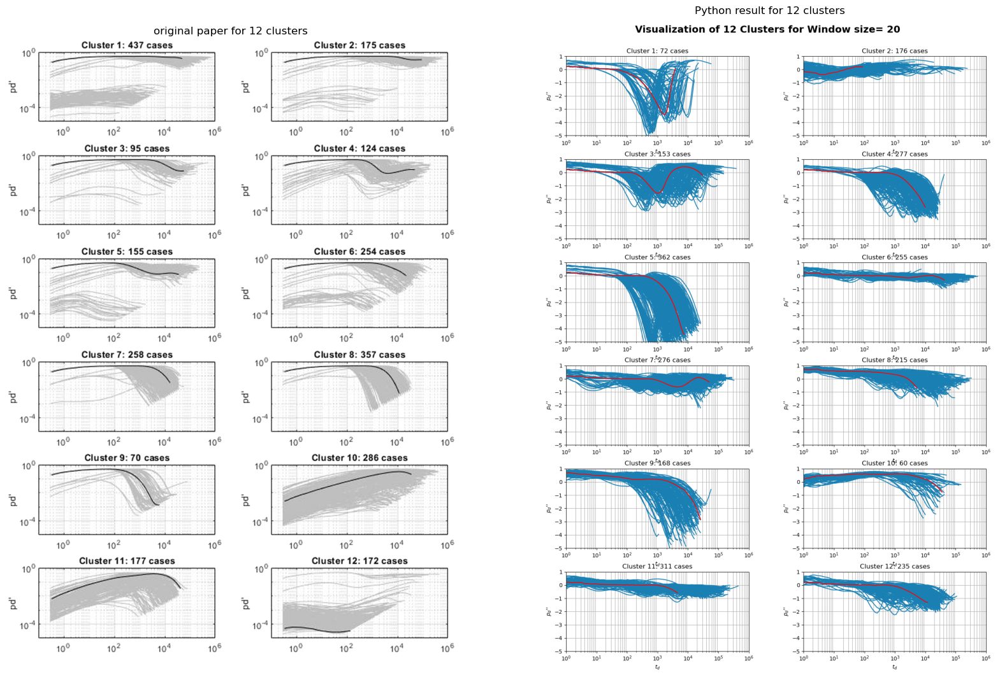

In [42]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig15_HTML.png"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig16_plottingperCluster_secDerivative_12_20.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 12 clusters')

plt.show()

### 5.1.2. First Derivative of Pressure

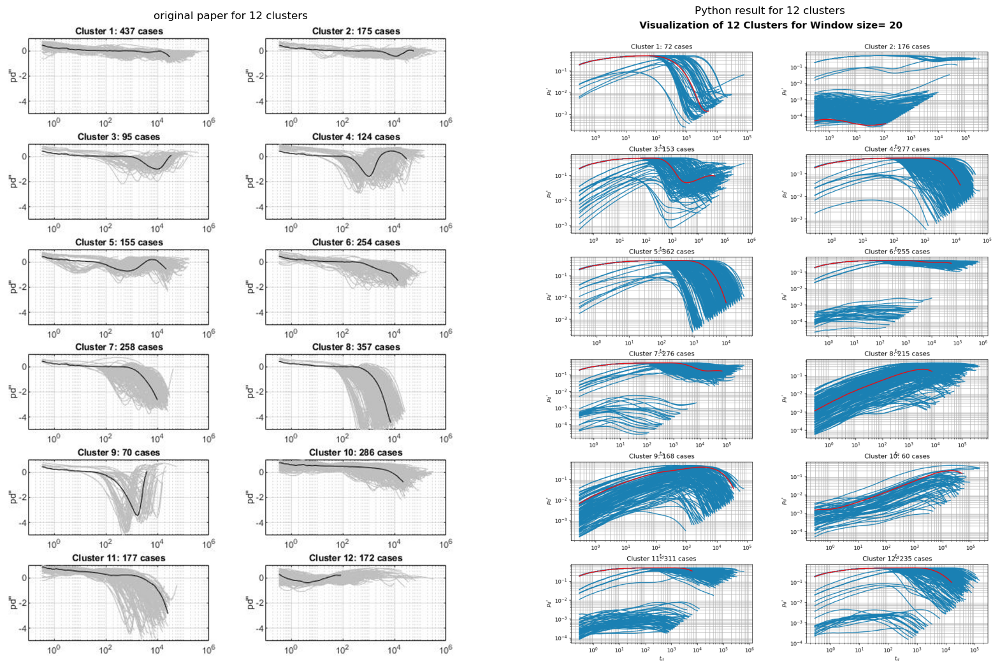

In [43]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig16_HTML.png"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig15_plottingperCluster_firstDerivative12_20.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 12 clusters')

plt.show()

after an in-depth comparision between these two plots, I think clusters in pythin code could be related to the one in the original paper as below:
1. cluster 1 -> 9
2. cluster 2 -> 12
3. cluster 3 -> 4
4. cluster 4 -> 6
5. cluster 5 -> 8 
6. cluster 6 -> 2 
7. cluster 7 -> 5,3
8. cluster 8 -> 10
9. cluster 9 -> 11
10. cluster 10 -> 10
11. cluster 11 -> 1
12. cluster 12 -> 7

It seems that for 12 number of clusters, most of the recognixed type curves are the same, but in python the again cluster 5 and 3 are combined together and instead, cluster 10 is devided to 2 distinct groups

## 6.2. comparing Silhoutte plot

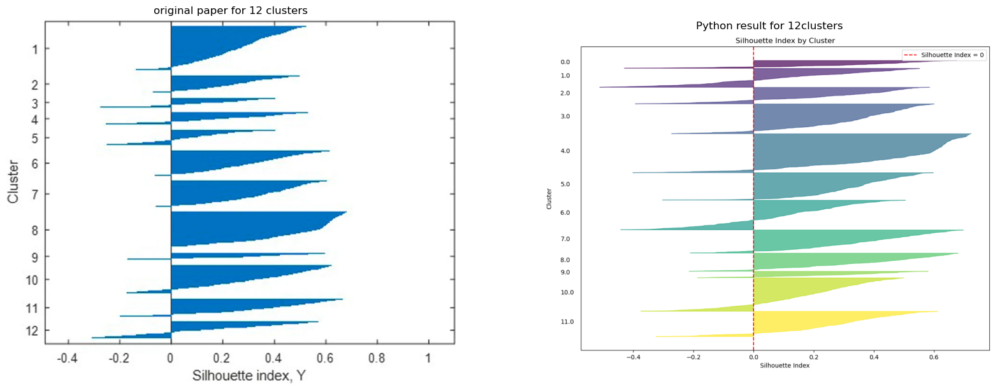

In [5]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig17_HTML.png?as=webp"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig17_Silhouette_index_12_20.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 15))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 12clusters')

plt.show()

So the average Silhouette index for python model is 0.27 and in the original paper is almost 0.3. Aslo for the python code 15.4% of the samples are missclassifid and in the original paper it is 12%.

Moreover, comparing the graph with the similarity proposed in section 6.1. shows that our analysis for finding the similarities here was correct

## 5.3. Comparing 3D plot

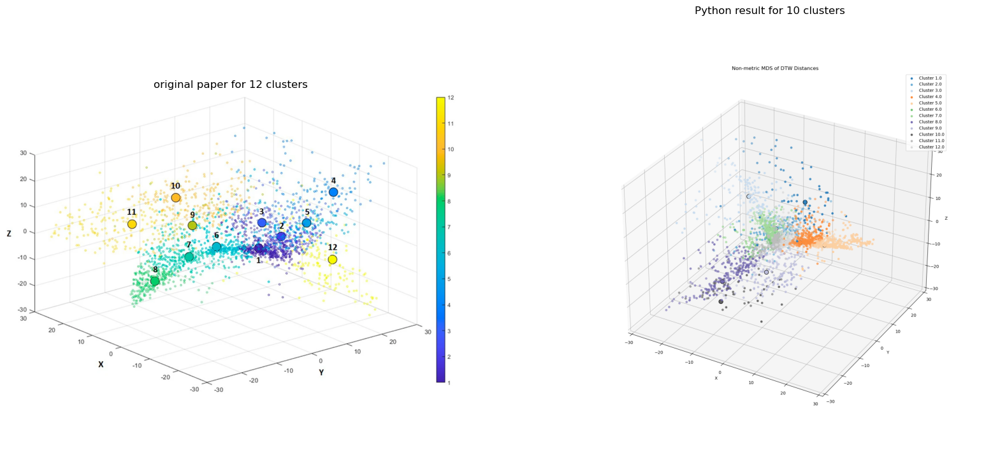

In [6]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig18_HTML.png?as=webp"  # replace with your URL
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))#imshow works with arrays of pixel data so we need to convert your images to arrays first.

# Local image
img_local = Image.open('results/Fig18_3Drespresentation_12_20.png') 

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 15))

# Display the images
ax[0].imshow(img_web)
ax[0].axis('off')  # Hide axes
ax[0].set_title('original paper for 12 clusters')

ax[1].imshow(img_local)
ax[1].axis('off')  # Hide axes
ax[1].set_title('Python result for 10 clusters')

plt.show()

As it is stated in the paper, in the left figure data belonging to clusters 1–8 plotted narrowly along the origin of the x-axis, while clusters 10–12 plotted at a significant distance away from the origin of the x-axis, indicating that these p′ were considerably different in comparison. for the left one, this distant clsuters are 2, 6 and 9 which are equivalent to 2, 8, 9 and 10. again this shows that our comparison is consistent.

## 5.4. Final Discussion based on box plot

Unfortunately, I dont have the data for plotting the box plotr for my result, but we can refer to the box plot which is in the original paper 

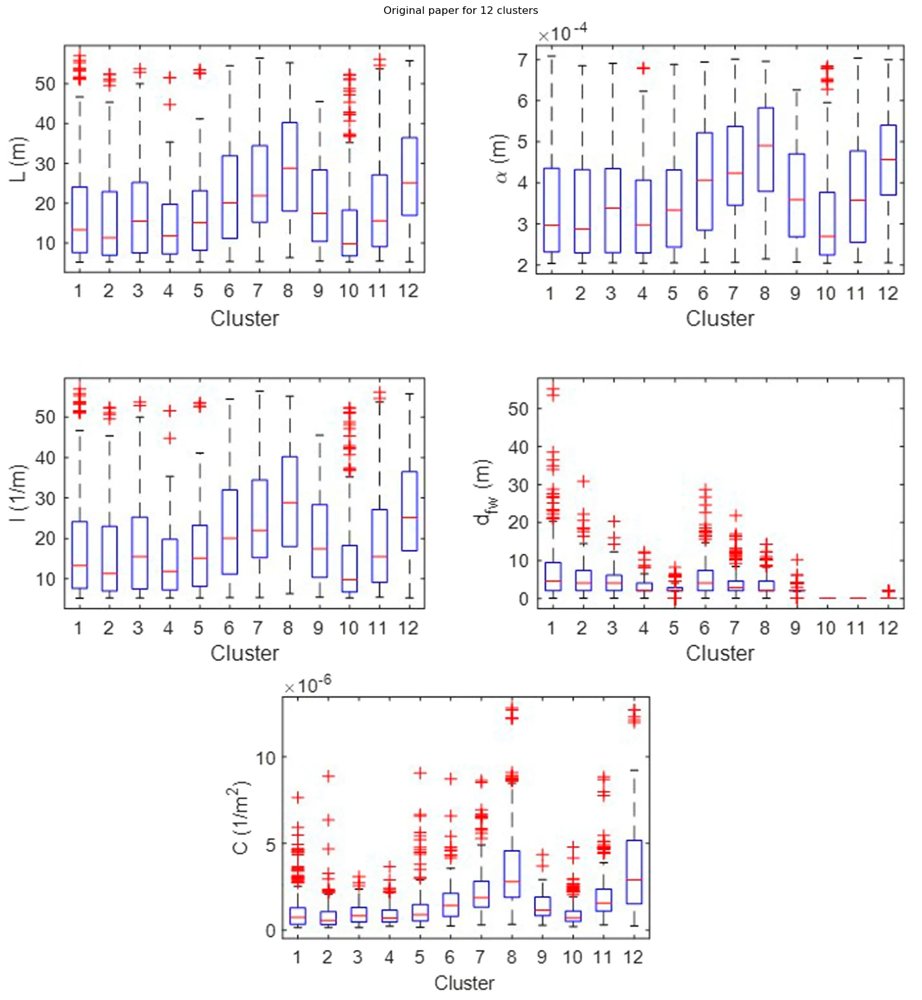

In [50]:
# URL of the image
url = "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs11242-023-01929-1/MediaObjects/11242_2023_1929_Fig19_HTML.png?as=webp"
response = requests.get(url)
img_web = Image.open(BytesIO(response.content))

# Create a figure with one subplot
fig, ax = plt.subplots(figsize=(20, 20))

# Display the image
ax.imshow(img_web)
ax.axis('off')  # Hide axes
ax.set_title('Original paper for 12 clusters')

plt.show()

looking at the box plot abow, it seems that clusters 3 and 5 are similar and we might be able to consider them as one cluster